# Final GAN V1

In this notebook we create and train a generative model based on the paper [*Image-to-Image Translation with Conditional Adversarial Networks*](https://arxiv.org/abs/1611.07004) by Isola et al. 2017, also known as Pix2Pix, which is a type of conditional GAN, or cGAN.



## Dataset

We will use the face image and coressponding face edges from our data folder. Add more info latter.

## Goals

For this notebook I will:
1.   Implement the loss of a Pix2Pix model that differentiates it from a supervised U-Net.
2.   Observe the change in generator priorities as the Pix2Pix generator trains, changing its emphasis from reconstruction to realism.



## Import Libraries and Load data

In [1]:
#Run THIS if your training on GPU 
!nvidia-smi --query-gpu=gpu_name,driver_version,memory.total --format=csv

name, driver_version, memory.total [MiB]
Tesla T4, 418.67, 15079 MiB


In [2]:
# VERSION = "nightly" #@param ["20200220", "nightly", "xrt==1.15.0"]
# !curl https://raw.githubusercontent.com/pytorch/xla/master/contrib/scripts/env-setup.py -o pytorch-xla-env-setup.py
# # !python pytorch-xla-env-setup.py --version $VERSION
# !python pytorch-xla-env-setup.py --apt-packages libomp5 libopenblas-dev

In [3]:
import torch, helper, os
# # imports the torch_xla package
# import torch_xla
# import torch_xla.core.xla_model as xm


In [4]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

corpus = os.path.join("/content/gdrive/My Drive/", "face-data")


Mounted at /content/gdrive


In [5]:
from torch import nn
from tqdm.auto import tqdm
from torchvision import datasets, transforms
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
import torch.nn.functional as F
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

torch.manual_seed(0)

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# IMAGE_PATH = '../input/face-class-data/class/'
IMAGE_PATH = corpus
SAMPLE_PATH = '../'

if not os.path.exists(SAMPLE_PATH):
    os.makedirs(SAMPLE_PATH)

# We transform the data to tensors and resize them to desired size (O(1) operation)
def load_data_sets(data_dir,batch_size):
    transform = transforms.Compose([transforms.Resize(256),
                                    transforms.ToTensor()])
    dataset = datasets.ImageFolder(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

#     images, labels = next(iter(dataloader))
    # helper.imshow(images[0], normalize=False)
    return dataloader

def show_tensor_images(image_tensor, num_images=25, size=(3, 256, 256)):
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## U-Net 
[U-Net: Convolutional Networks for Biomedical Image Segmentation](https://arxiv.org/abs/1505.04597), by Ronneberger et al. 2015

Images are first fed through many convolutional layers which reduce height and width while increasing the channels (contracting path) For example, a set of two 2 x 2 convolutions with a stride of 2, will take a 1 x 28 x 28 (channels, height, width) grayscale image and result in a 2 x 14 x 14 representation. The "expanding path" does the opposite, gradually growing the image with fewer and fewer channels.

In [6]:
class ResidualBlock(nn.Module):
    '''
    ResidualBlock Class:
    Performs two convolutions and an instance normalization, the input is added
    to this output to form the residual block output.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.instancenorm = nn.InstanceNorm2d(input_channels)
        self.activation = nn.ReLU()

    def forward(self, x):
        '''
        Function for completing a forward pass of ResidualBlock: 
        Given an image tensor, completes a residual block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        original_x = x.clone()
        x = self.conv1(x)
        x = self.instancenorm(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.instancenorm(x)
        return original_x + x

### Contracting Path
The contracting path is the encoder section of the U-Net, which has several downsampling steps as part of it. The authors give more detail of the remaining parts in the following paragraph from the paper (Renneberger, 2015):

    The contracting path follows the typical architecture of a convolutional network. It consists of the repeated application of two 3 x 3 convolutions (unpadded convolutions), each followed by a rectified linear unit (ReLU) and a 2 x 2 max pooling operation with stride 2 for downsampling. At each downsampling step we double the number of feature channels.



In [7]:
class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs two convolutions followed by a max pool operation.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_bn=True, kernel_size=3, activation='relu'):
        super(ContractingBlock, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels * 2, kernel_size=kernel_size, padding=1, stride=2, padding_mode='reflect')
        self.activation = nn.ReLU() if activation == 'relu' else nn.LeakyReLU(0.2)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels * 2)
        self.use_bn = use_bn

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock: 
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x


### Expanding Path
The expanding blocks for the expanding path is the decoding section of U-Net which has several upsampling steps as part of it. In order to do this, you'll also need to write a crop function. This is so you can crop the image from the contracting path and concatenate it to the current image on the expanding path—this is to form a skip connection. Again, the details are from the paper (Renneberger, 2015):

    Every step in the expanding path consists of an upsampling of the feature map followed by a 2 x 2 convolution (“up-convolution”) that halves the number of feature channels, a concatenation with the correspondingly cropped feature map from the contracting path, and two 3 x 3 convolutions, each followed by a ReLU. The cropping is necessary due to the loss of border pixels in every convolution.

In [8]:
def crop(image, new_shape):
    '''
    Function for cropping an image tensor: Given an image tensor and the new shape,
    crops to the center pixels (assumes that the input's size and the new size are
    even numbers).
    Parameters:
        image: image tensor of shape (batch size, channels, height, width)
        new_shape: a torch.Size object with the shape you want x to have
    '''
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - new_shape[2] // 2
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - new_shape[3] // 2
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width]
    return cropped_image

In [9]:
class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class:
    Performs a convolutional transpose operation in order to upsample, 
        with an optional instance norm
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, use_bn=True):
        super(ExpandingBlock, self).__init__()
        self.conv1 = nn.ConvTranspose2d(input_channels, input_channels // 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        if use_bn:
            self.instancenorm = nn.InstanceNorm2d(input_channels // 2)
        self.use_bn = use_bn
        self.activation = nn.ReLU()

    def forward(self, x):
        '''
        Function for completing a forward pass of ExpandingBlock: 
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
            skip_con_x: the image tensor from the contracting path (from the opposing block of x)
                    for the skip connection
        '''
        x = self.conv1(x)
        if self.use_bn:
            x = self.instancenorm(x)
        x = self.activation(x)
        return x
       

### Final Layer
The final feature mapping block, takes in a tensor with arbitrarily many tensors and produces a tensor with the same number of pixels but with the correct number of output channels. From the paper (Renneberger, 2015):

    At the final layer a 1x1 convolution is used to map each 64-component feature vector to the desired number of classes. In total the network has 23 convolutional layers.

In [10]:
class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a Generator - 
    maps each the output to the desired number of output channels
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=7, padding=3, padding_mode='reflect')

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock: 
        Given an image tensor, returns it mapped to the desired number of channels.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv(x)
        return x


### U-Net

In [11]:
class Generator(nn.Module):
    '''
    Generator Class
    A series of 2 contracting blocks, 9 residual blocks, and 2 expanding blocks to 
    transform an input image into an image from the other class, with an upfeature
    layer at the start and a downfeature layer at the end.
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super(Generator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        res_mult = 4
        self.res0 = ResidualBlock(hidden_channels * res_mult)
        self.res1 = ResidualBlock(hidden_channels * res_mult)
        self.res2 = ResidualBlock(hidden_channels * res_mult)
        self.res3 = ResidualBlock(hidden_channels * res_mult)
        self.res4 = ResidualBlock(hidden_channels * res_mult)
        self.res5 = ResidualBlock(hidden_channels * res_mult)
        self.res6 = ResidualBlock(hidden_channels * res_mult)
        self.res7 = ResidualBlock(hidden_channels * res_mult)
        self.res8 = ResidualBlock(hidden_channels * res_mult)
        self.expand2 = ExpandingBlock(hidden_channels * 4)
        self.expand3 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)
        self.tanh = torch.nn.Tanh()

    def forward(self, x):
        '''
        Function for completing a forward pass of Generator: 
        Given an image tensor, passes it through the U-Net with residual blocks
        and returns the output.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.res0(x2)
        x4 = self.res1(x3)
        x5 = self.res2(x4)
        x6 = self.res3(x5)
        x7 = self.res4(x6)
        x8 = self.res5(x7)
        x9 = self.res6(x8)
        x10 = self.res7(x9)
        x11 = self.res8(x10)
        x12 = self.expand2(x11)
        x13 = self.expand3(x12)
        xn = self.downfeature(x13)
        return self.tanh(xn)
        

## PatchGAN Discriminator

The discriminator based on the contracting path of the U-Net evaluates the realism of the generated images. The discriminator outputs a one-channel matrix of classifications instead of a single value. The discriminator's final layer will simply map from the final number of hidden channels to a single prediction for every pixel of the layer before it.

In [12]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Structured like the contracting path of the U-Net, the discriminator will
    output a matrix of values classifying corresponding portions of the image as real or fake. 
    Parameters:
        input_channels: the number of image input channels
        hidden_channels: the initial number of discriminator convolutional filters
    '''
    def __init__(self, input_channels, hidden_channels=64):
        super(Discriminator, self).__init__()
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels, use_bn=False, kernel_size=4, activation='lrelu')
        self.contract2 = ContractingBlock(hidden_channels * 2, kernel_size=4, activation='lrelu')
        self.contract3 = ContractingBlock(hidden_channels * 4, kernel_size=4, activation='lrelu')
        self.final = nn.Conv2d(hidden_channels * 8, 1, kernel_size=1)

    def forward(self, x, y):
        x = torch.cat([x, y], axis=1)
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        xn = self.final(x3)
        return xn
      

## Training Preparation
Parameters needed to be set in order to train correctly:
  *   **real_dim**: the number of channels of the real image and the number expected in the output image
  *   **adv_criterion**: an adversarial loss function to keep track of how well the GAN is fooling the discriminator and how well the discriminator is catching the GAN
  *   **recon_criterion**: a loss function that rewards similar images to the ground truth, which "reconstruct" the image
  *   **lambda_recon**: a parameter for how heavily the reconstruction loss should be weighed
  *   **n_epochs**: the number of times you iterate through the entire dataset when training
  *   **input_dim**: the number of channels of the input image
  *   **display_step**: how often to display/visualize the images
  *   **batch_size**: the number of images per forward/backward pass
  *   **lr**: the learning rate
  *   **target_shape**: the size of the output image (in pixels)
  *   **device**: the device type

In [13]:
import torch.nn.functional as F

real_dim = 3
adv_criterion = nn.MSELoss() 
recon_criterion = nn.L1Loss() 
lambda_recon = 200
n_epochs = 100
input_dim = 3
display_step = 200
batch_size = 4
lr = 0.0002
target_shape = 256
device = 'cuda' if torch.cuda.is_available() else 'cpu'
# Creates a random tensor on xla:1 (a Cloud TPU core)
# device = xm.xla_device()
# device = 'cuda' # use 'cuda' if this is running on a gpu else "cpu"

Initialize the generator (U-Net) and discriminator, as well as their optimizers.

In [14]:
gen = Generator(input_dim, real_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(input_dim + real_dim).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

pretrained = False
if pretrained:
    images_dir = '/content/gdrive/My Drive/PIX2PIX DATA'
    loaded_state = torch.load(f"{images_dir}/pix2pix_9800.pth")
    gen.load_state_dict(loaded_state["gen"])
    gen_opt.load_state_dict(loaded_state["gen_opt"])
    disc.load_state_dict(loaded_state["disc"])
    disc_opt.load_state_dict(loaded_state["disc_opt"])
else:
    gen = gen.apply(weights_init)
    disc = disc.apply(weights_init)

In [15]:
def get_gen_adversarial_loss(real, disc, gen, condition, adv_criterion, recon_criterion, lambda_recon):
    fake = gen(condition)
    disc_fake_hat = disc(fake, condition)
    adversarial_loss = adv_criterion(disc_fake_hat, torch.ones_like(disc_fake_hat))
    gen_rec_loss = recon_criterion(real, fake)
    gen_loss = adversarial_loss + lambda_recon * gen_rec_loss
    return gen_loss
    
def get_identity_loss(real, gen, identity_criterion):
    identity = gen(real)
    identity_loss = identity_criterion(identity, real)
    return identity_loss

In [16]:
def get_gen_loss(gen, disc, real, condition, adv_criterion, identity_criterion, recon_criterion, lambda_recon, lambda_identity=0.1):
    gen_adversarial_loss = get_gen_adversarial_loss(real, disc, gen, condition, adv_criterion, recon_criterion, lambda_recon)

    gen_identity_loss = get_identity_loss(real, gen, identity_criterion)

    gen_loss = lambda_identity * gen_identity_loss + gen_adversarial_loss 
    return gen_loss



## Pix2Pix Training

Finally, you can train the model and see some of your maps!

In [17]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch

Pretrained initial state


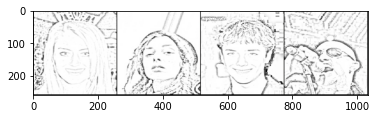

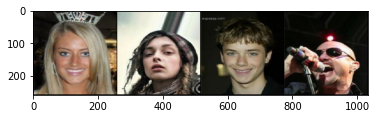

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


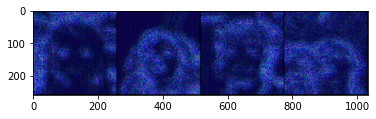

Epoch 0: Step 200: Generator (U-Net) loss: 41.52597694396972, Discriminator loss: 0.2086405675113202


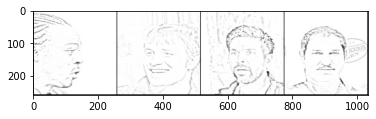

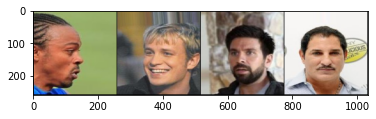

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


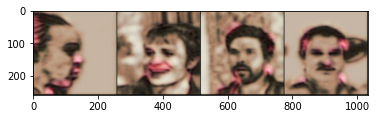

Epoch 0: Step 400: Generator (U-Net) loss: 35.35555439949035, Discriminator loss: 0.1937197594344616


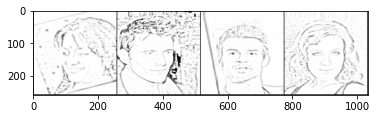

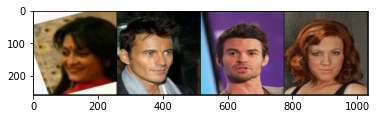

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


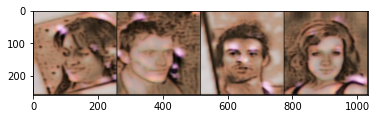

Epoch 1: Step 600: Generator (U-Net) loss: 32.95890951156616, Discriminator loss: 0.20110117424279442


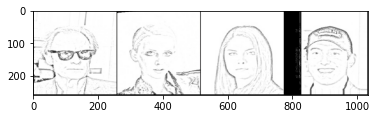

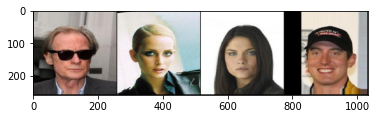

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


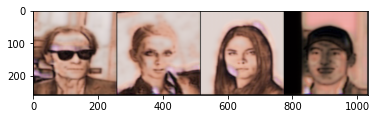

Epoch 1: Step 800: Generator (U-Net) loss: 31.357242040634137, Discriminator loss: 0.1958121465146541


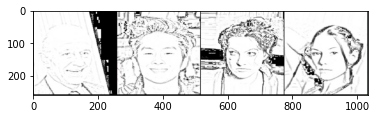

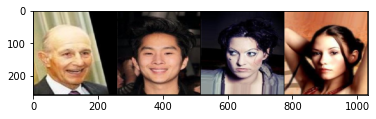

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


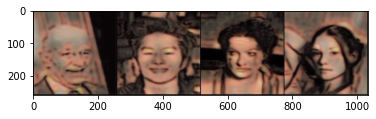

Epoch 2: Step 1000: Generator (U-Net) loss: 30.012604236602805, Discriminator loss: 0.19882515057921432


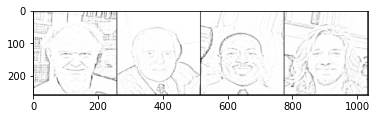

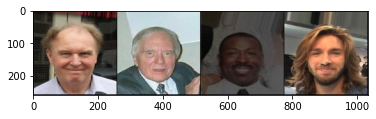

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


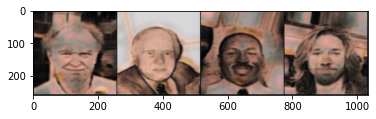

Epoch 2: Step 1200: Generator (U-Net) loss: 28.988155460357675, Discriminator loss: 0.20281573072075845


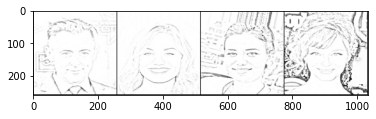

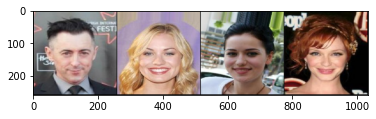

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


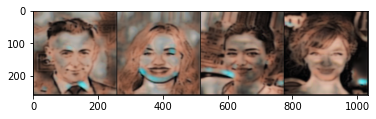

Epoch 2: Step 1400: Generator (U-Net) loss: 27.411862840652464, Discriminator loss: 0.20277132626622915


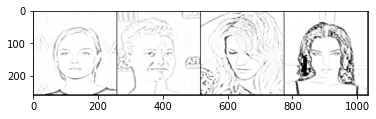

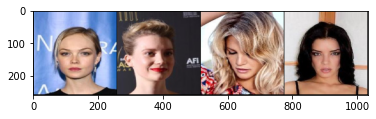

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


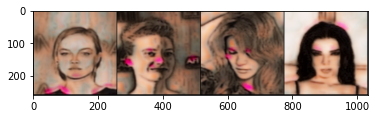

Epoch 3: Step 1600: Generator (U-Net) loss: 27.298565645217906, Discriminator loss: 0.19880501240491866


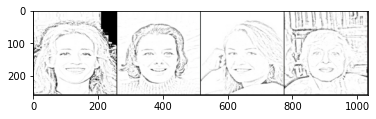

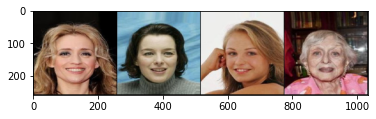

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


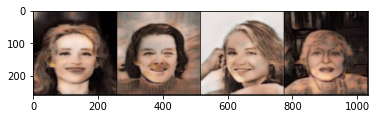

Epoch 3: Step 1800: Generator (U-Net) loss: 26.368406496047964, Discriminator loss: 0.19879042629152538


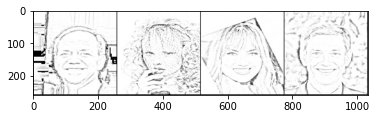

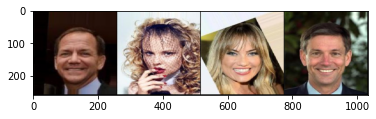

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


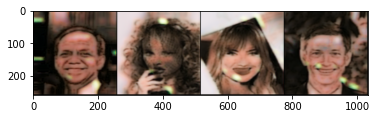

Epoch 4: Step 2000: Generator (U-Net) loss: 26.201912384033193, Discriminator loss: 0.20104486376047132


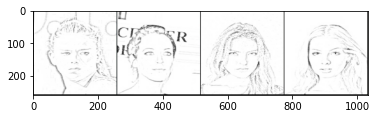

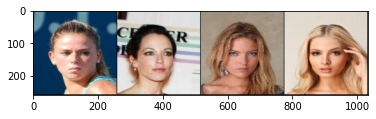

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


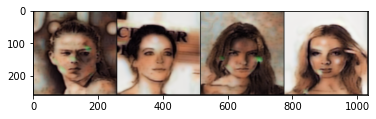

Epoch 4: Step 2200: Generator (U-Net) loss: 25.65921204566956, Discriminator loss: 0.20333718352019783


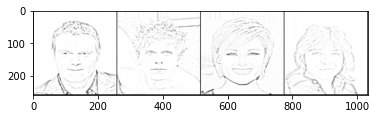

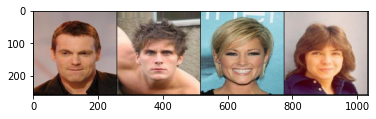

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


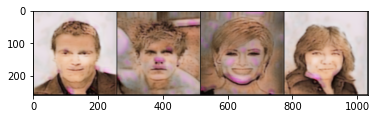

Epoch 4: Step 2400: Generator (U-Net) loss: 25.186040821075437, Discriminator loss: 0.19847607981413598


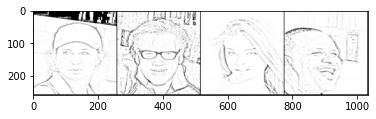

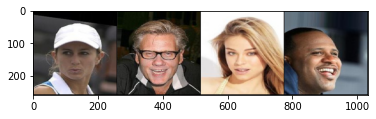

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


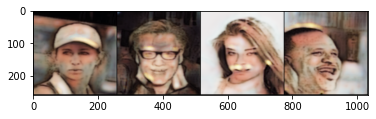

Epoch 5: Step 2600: Generator (U-Net) loss: 25.094234924316407, Discriminator loss: 0.2042571468651295


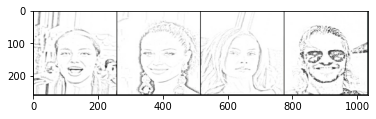

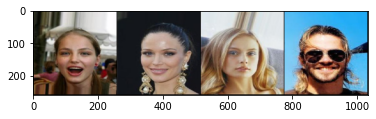

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


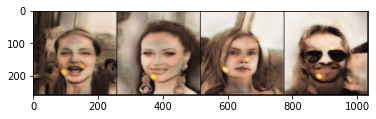

Epoch 5: Step 2800: Generator (U-Net) loss: 25.099412508010868, Discriminator loss: 0.2025196842104196


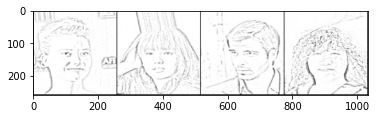

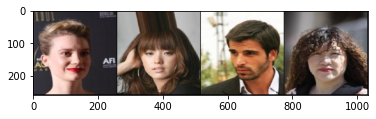

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


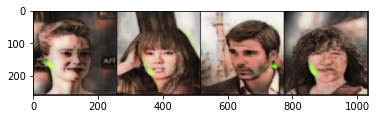

Epoch 6: Step 3000: Generator (U-Net) loss: 24.498278179168683, Discriminator loss: 0.2020553736016153


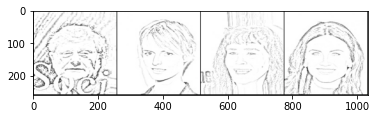

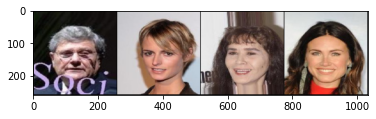

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


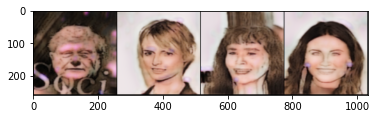

Epoch 6: Step 3200: Generator (U-Net) loss: 23.71272100448611, Discriminator loss: 0.19827319934964177


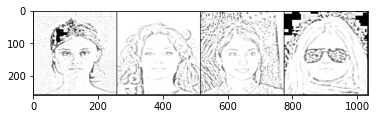

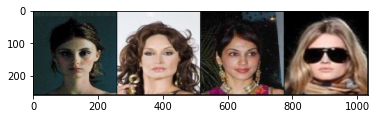

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


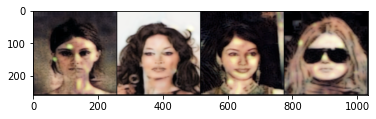

Epoch 6: Step 3400: Generator (U-Net) loss: 23.638644418716424, Discriminator loss: 0.2019570725038648


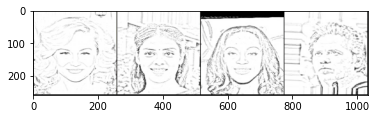

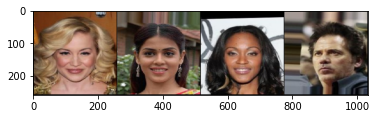

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


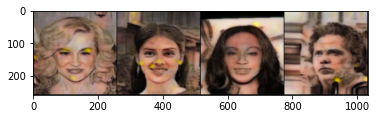

Epoch 7: Step 3600: Generator (U-Net) loss: 23.31088627338409, Discriminator loss: 0.20304149307310582


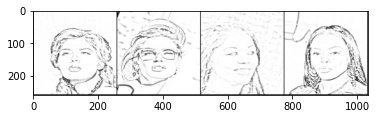

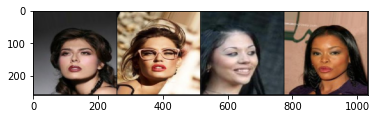

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


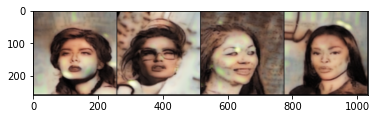

Epoch 7: Step 3800: Generator (U-Net) loss: 22.984433083534253, Discriminator loss: 0.19512882251292465


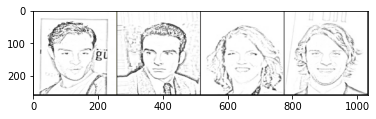

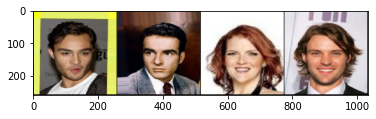

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


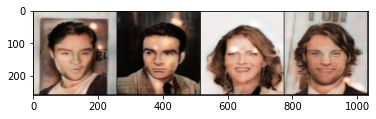

Epoch 8: Step 4000: Generator (U-Net) loss: 22.628660030364987, Discriminator loss: 0.19004616193473334


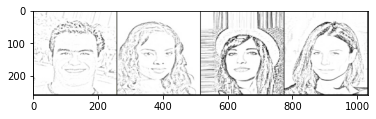

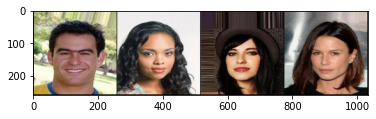

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


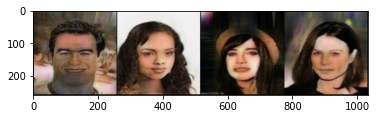

Epoch 8: Step 4200: Generator (U-Net) loss: 23.209503993988033, Discriminator loss: 0.18604122068732978


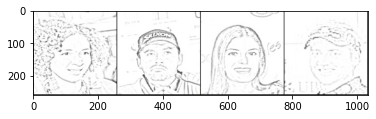

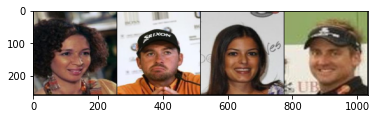

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


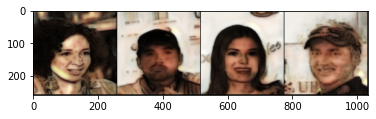

Epoch 8: Step 4400: Generator (U-Net) loss: 22.45899559497833, Discriminator loss: 0.19421571873128413


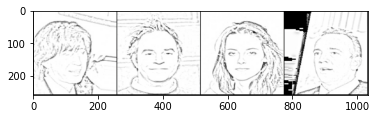

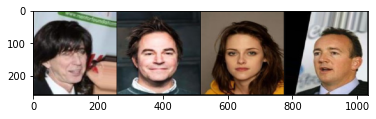

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


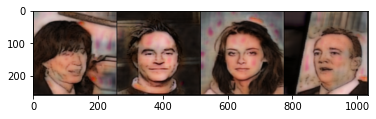

Epoch 9: Step 4600: Generator (U-Net) loss: 22.197730536460867, Discriminator loss: 0.1807361801713705


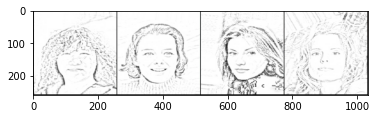

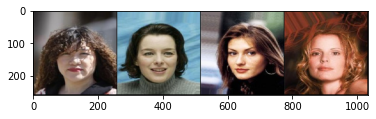

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


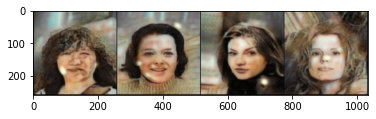

Epoch 9: Step 4800: Generator (U-Net) loss: 22.06524713993071, Discriminator loss: 0.1931029548496006


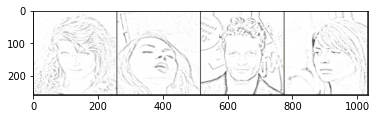

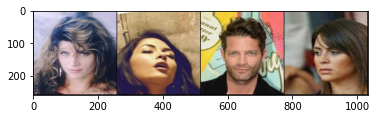

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


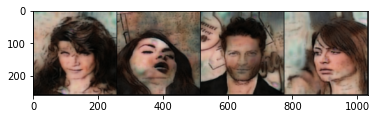

Epoch 10: Step 5000: Generator (U-Net) loss: 22.151413722038267, Discriminator loss: 0.18857267994433644


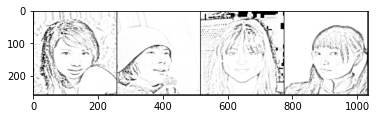

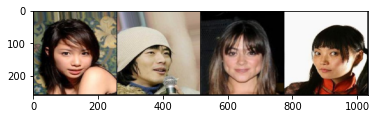

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


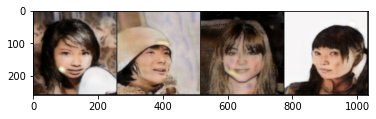

Epoch 10: Step 5200: Generator (U-Net) loss: 21.494320964813223, Discriminator loss: 0.1861429021134973


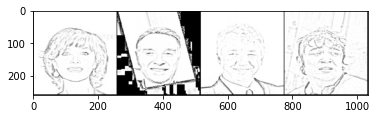

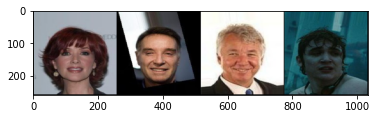

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


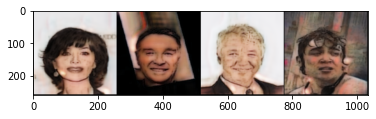

Epoch 10: Step 5400: Generator (U-Net) loss: 21.619352688789373, Discriminator loss: 0.18309493687003858


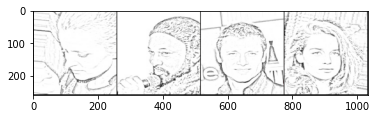

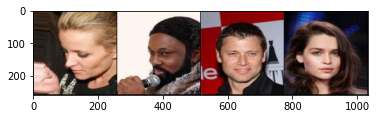

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


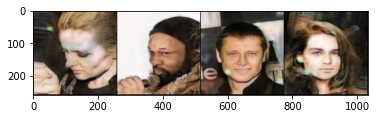

Epoch 11: Step 5600: Generator (U-Net) loss: 21.41831478595734, Discriminator loss: 0.18401606295257805


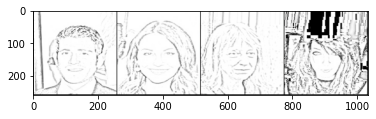

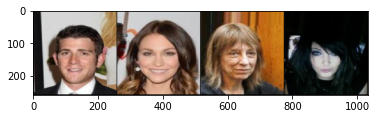

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


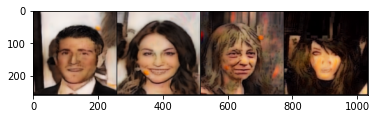

Epoch 11: Step 5800: Generator (U-Net) loss: 21.268632154464736, Discriminator loss: 0.18493112068623302


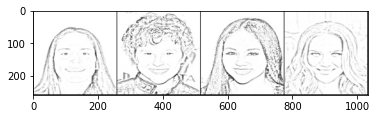

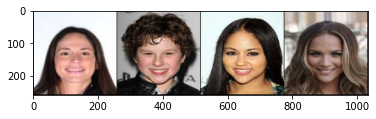

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


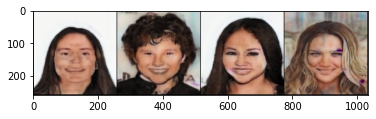

Epoch 12: Step 6000: Generator (U-Net) loss: 21.193430833816535, Discriminator loss: 0.17514265038073057


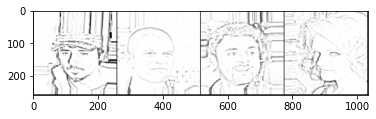

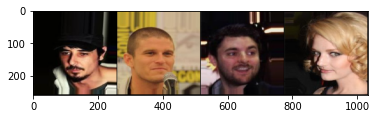

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


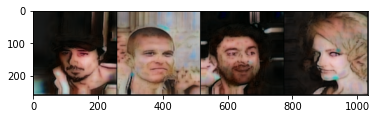

Epoch 12: Step 6200: Generator (U-Net) loss: 20.868449602127093, Discriminator loss: 0.1778806670755147


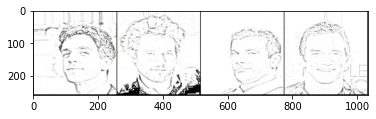

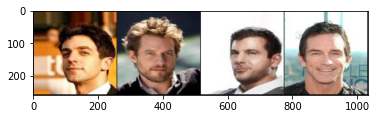

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


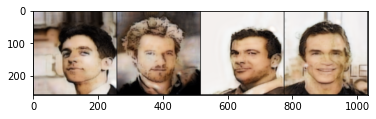

Epoch 12: Step 6400: Generator (U-Net) loss: 21.182655444145208, Discriminator loss: 0.18488380786031486


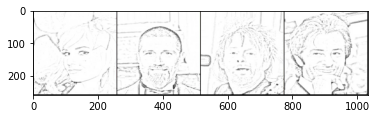

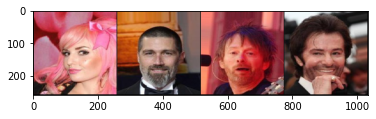

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


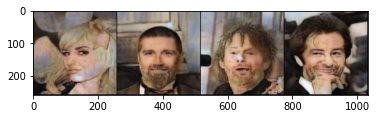

Epoch 13: Step 6600: Generator (U-Net) loss: 20.61101470947266, Discriminator loss: 0.17639792922884232


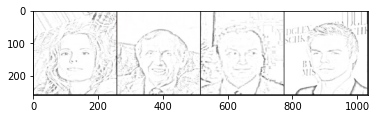

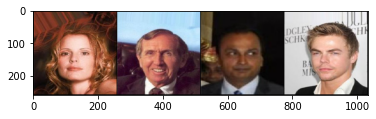

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


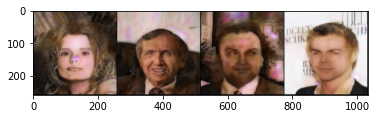

Epoch 13: Step 6800: Generator (U-Net) loss: 20.094285817146307, Discriminator loss: 0.17919895660132168


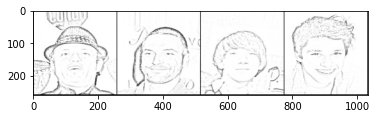

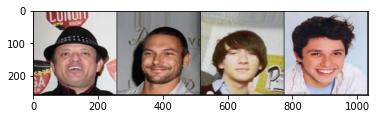

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


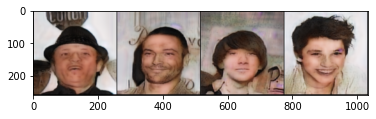

Epoch 14: Step 7000: Generator (U-Net) loss: 20.64400563240052, Discriminator loss: 0.17224416494369502


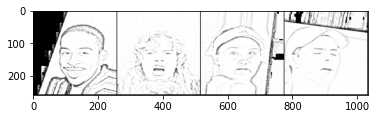

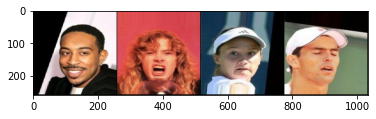

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


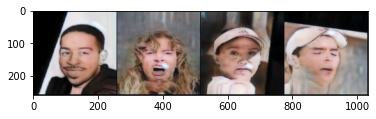

Epoch 14: Step 7200: Generator (U-Net) loss: 19.957864551544176, Discriminator loss: 0.17661353319883355


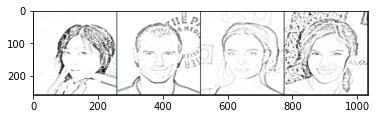

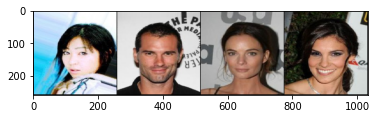

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


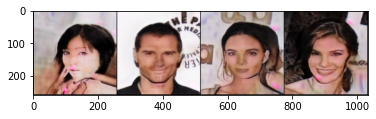

Epoch 14: Step 7400: Generator (U-Net) loss: 20.74258411884308, Discriminator loss: 0.16324423093348744


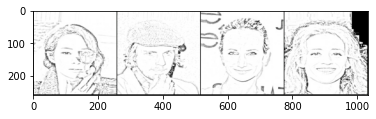

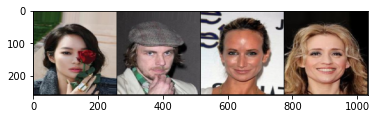

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


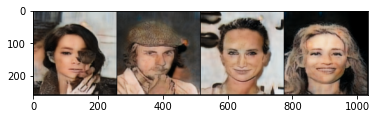

Epoch 15: Step 7600: Generator (U-Net) loss: 20.295947146415713, Discriminator loss: 0.16790194094181068


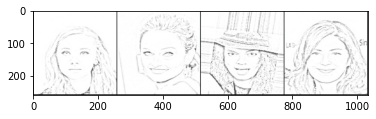

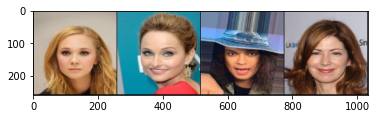

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


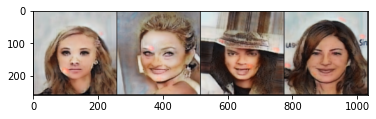

Epoch 15: Step 7800: Generator (U-Net) loss: 19.818531193733218, Discriminator loss: 0.16868003092706194


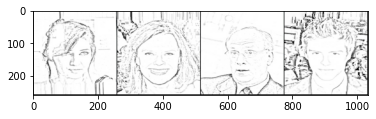

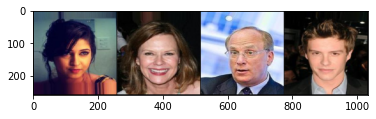

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


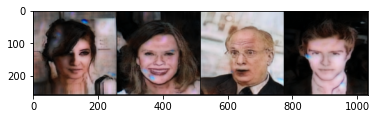

Epoch 16: Step 8000: Generator (U-Net) loss: 19.769163212776174, Discriminator loss: 0.17043473172932871


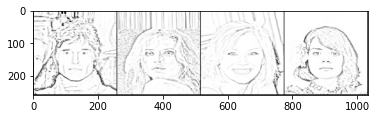

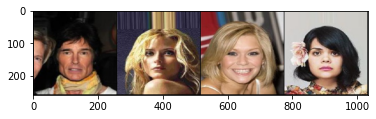

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


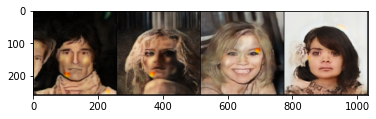

Epoch 16: Step 8200: Generator (U-Net) loss: 19.65119661808014, Discriminator loss: 0.16922897120937697


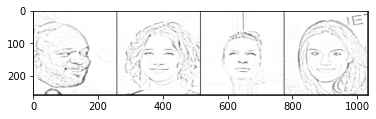

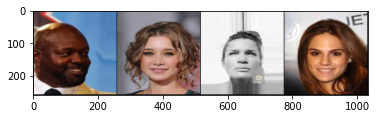

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


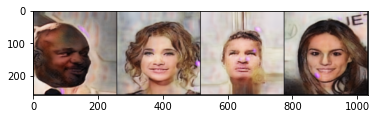

Epoch 16: Step 8400: Generator (U-Net) loss: 19.614164094924934, Discriminator loss: 0.16588769819587468


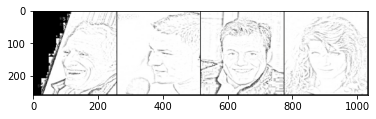

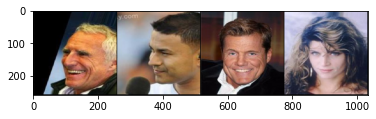

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


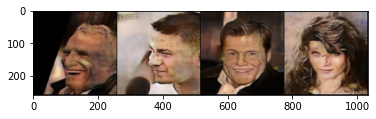

Epoch 17: Step 8600: Generator (U-Net) loss: 19.473197264671338, Discriminator loss: 0.16684817925095552


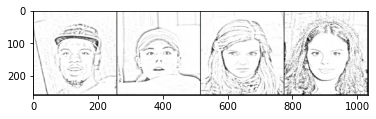

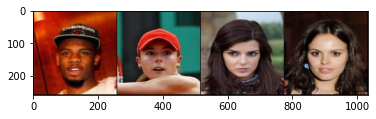

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


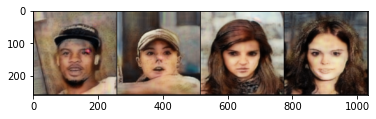

Epoch 17: Step 8800: Generator (U-Net) loss: 19.34876850128174, Discriminator loss: 0.1674459973163903


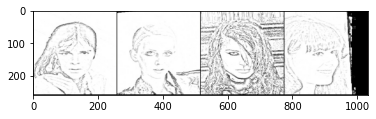

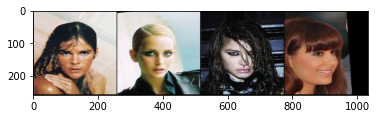

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


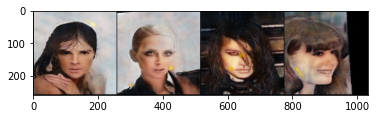

Epoch 18: Step 9000: Generator (U-Net) loss: 19.211960859298706, Discriminator loss: 0.16258354485034943


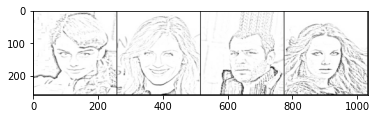

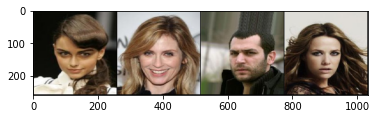

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


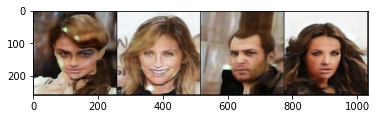

Epoch 18: Step 9200: Generator (U-Net) loss: 19.21417546749116, Discriminator loss: 0.16256604224443433


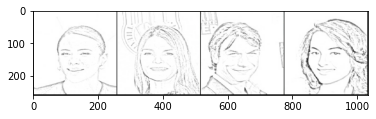

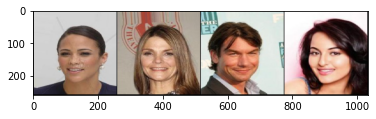

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


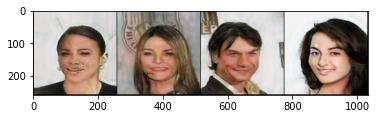

Epoch 18: Step 9400: Generator (U-Net) loss: 18.98965314388276, Discriminator loss: 0.16718985760584476


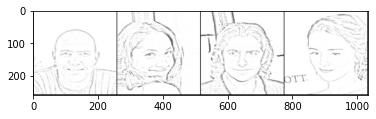

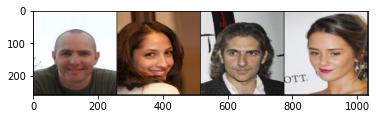

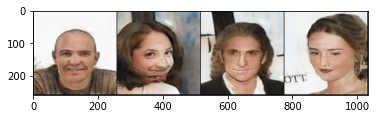

Epoch 19: Step 9600: Generator (U-Net) loss: 18.946468052864084, Discriminator loss: 0.16531143344938753


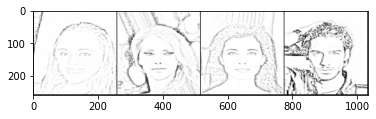

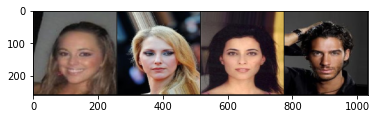

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


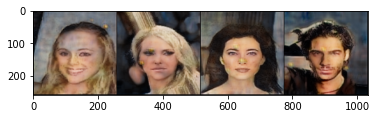

Epoch 19: Step 9800: Generator (U-Net) loss: 18.751802010536192, Discriminator loss: 0.1670390255749226


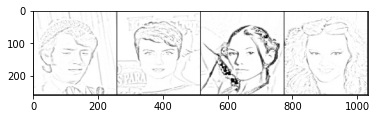

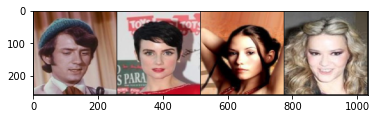

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


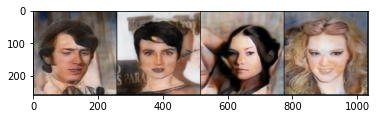

Epoch 20: Step 10000: Generator (U-Net) loss: 18.898640279769886, Discriminator loss: 0.16641206698492178


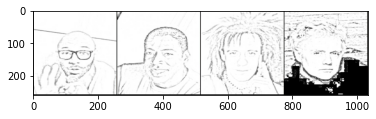

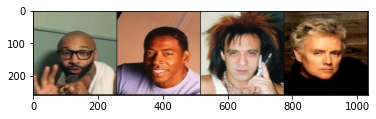

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


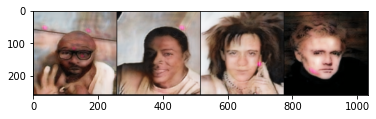

Epoch 20: Step 10200: Generator (U-Net) loss: 18.346567893028265, Discriminator loss: 0.16169621719047433


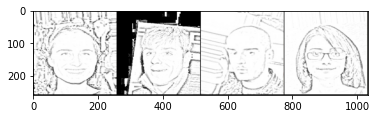

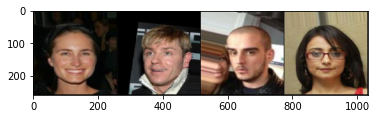

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


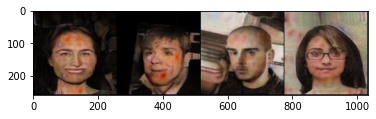

Epoch 20: Step 10400: Generator (U-Net) loss: 18.769116849899294, Discriminator loss: 0.16189430631697185


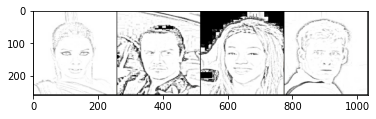

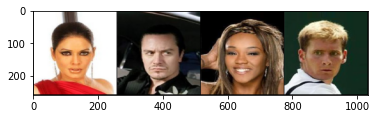

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


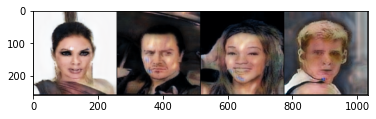

Epoch 21: Step 10600: Generator (U-Net) loss: 18.623337039947508, Discriminator loss: 0.16594486124813554


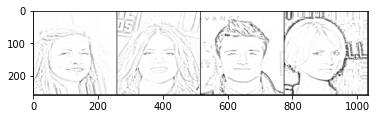

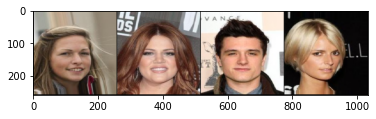

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


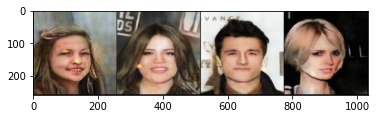

Epoch 21: Step 10800: Generator (U-Net) loss: 18.94693497180939, Discriminator loss: 0.16142603214830156


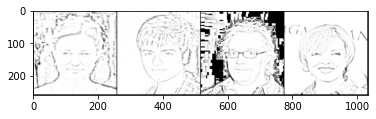

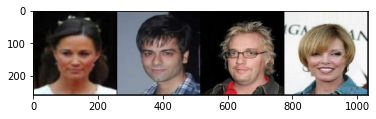

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


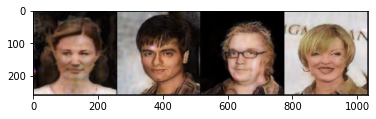

Epoch 22: Step 11000: Generator (U-Net) loss: 18.052542648315427, Discriminator loss: 0.16008851930499077


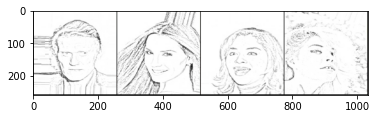

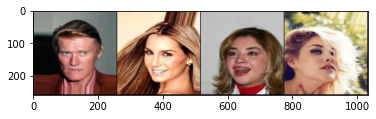

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


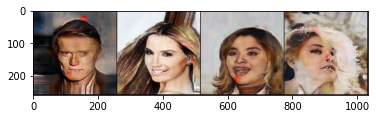

Epoch 22: Step 11200: Generator (U-Net) loss: 18.054105386734, Discriminator loss: 0.16331393998116245


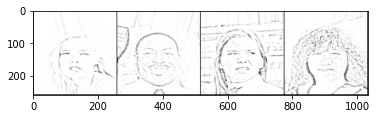

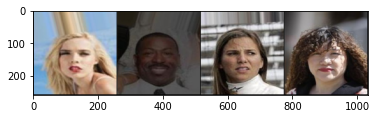

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


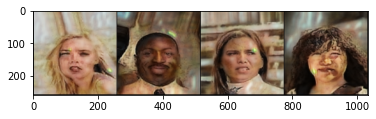

Epoch 22: Step 11400: Generator (U-Net) loss: 18.174001541137702, Discriminator loss: 0.16704026564955712


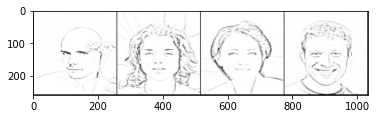

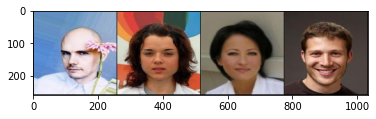

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


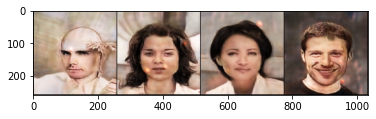

Epoch 23: Step 11600: Generator (U-Net) loss: 17.944976582527158, Discriminator loss: 0.16112684374675162


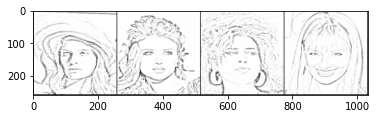

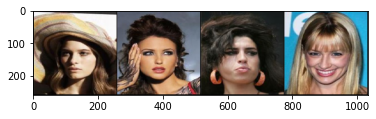

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


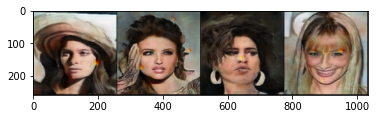

Epoch 23: Step 11800: Generator (U-Net) loss: 17.79932279109954, Discriminator loss: 0.15834487704560157


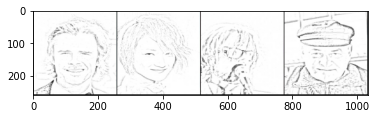

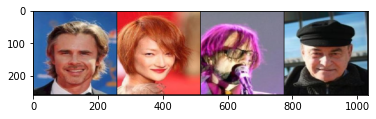

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


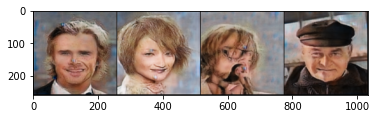

Epoch 24: Step 12000: Generator (U-Net) loss: 17.818141322135933, Discriminator loss: 0.16757254963740703


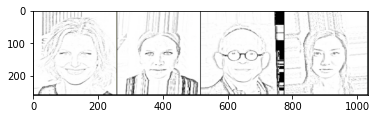

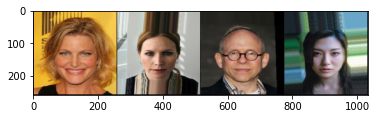

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


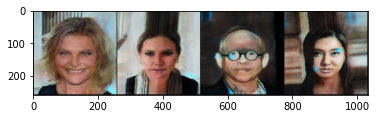

Epoch 24: Step 12200: Generator (U-Net) loss: 17.665123910903933, Discriminator loss: 0.1549126472324133


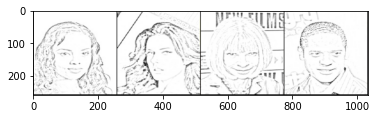

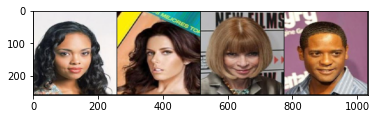

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


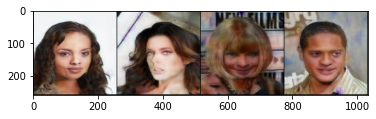

Epoch 24: Step 12400: Generator (U-Net) loss: 17.568910470008852, Discriminator loss: 0.16037702821195132


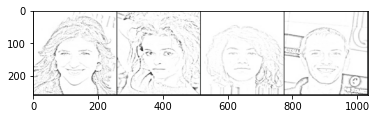

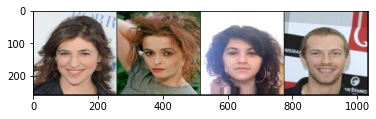

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


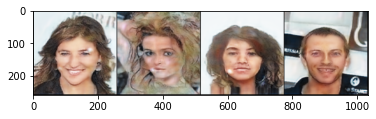

Epoch 25: Step 12600: Generator (U-Net) loss: 17.88688440799713, Discriminator loss: 0.1717936780676245


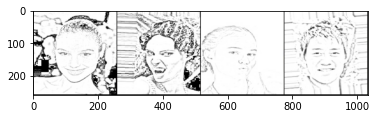

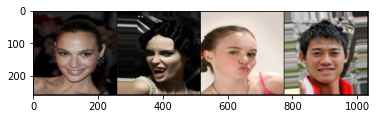

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


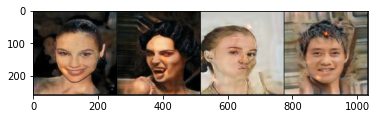

Epoch 25: Step 12800: Generator (U-Net) loss: 17.351848902702326, Discriminator loss: 0.1553416862525045


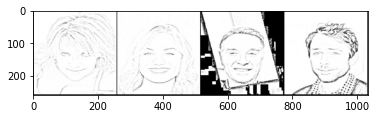

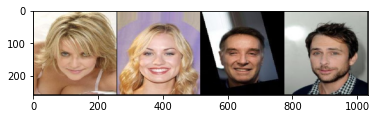

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


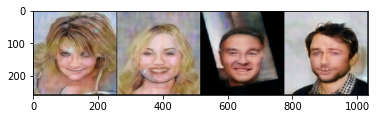

Epoch 26: Step 13000: Generator (U-Net) loss: 17.717477760314935, Discriminator loss: 0.16814090266823772


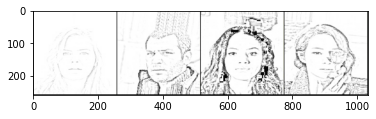

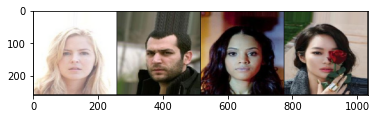

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


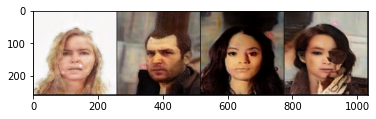

Epoch 26: Step 13200: Generator (U-Net) loss: 16.718410296440116, Discriminator loss: 0.16002955453470363


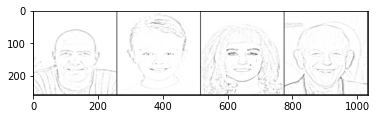

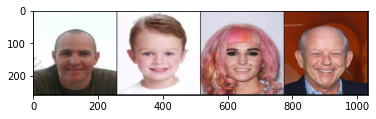

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


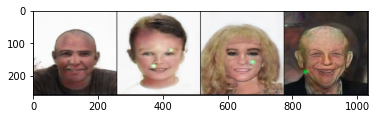

Epoch 26: Step 13400: Generator (U-Net) loss: 17.489054408073425, Discriminator loss: 0.16256670936942103


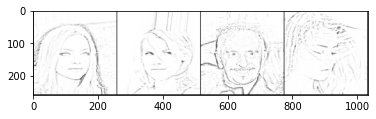

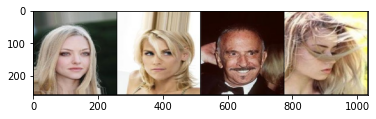

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


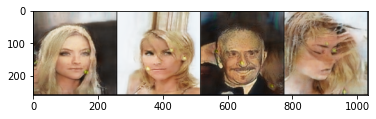

Epoch 27: Step 13600: Generator (U-Net) loss: 17.188225550651545, Discriminator loss: 0.15247395794838664


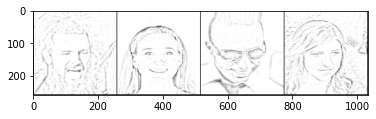

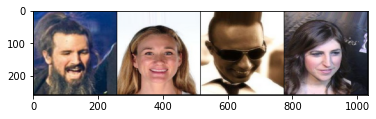

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


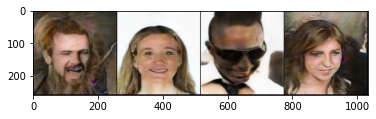

Epoch 27: Step 13800: Generator (U-Net) loss: 17.049135584831237, Discriminator loss: 0.16311475155875085


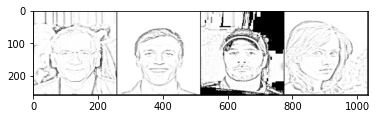

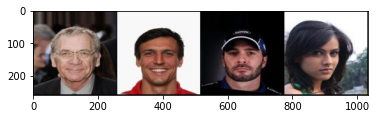

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


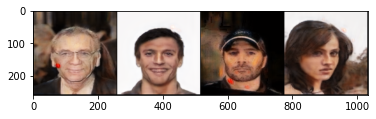

Epoch 28: Step 14000: Generator (U-Net) loss: 17.406539754867556, Discriminator loss: 0.1633345314487815


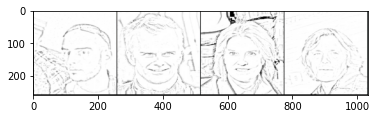

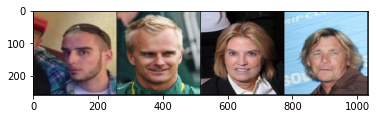

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


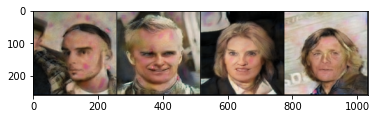

Epoch 28: Step 14200: Generator (U-Net) loss: 16.83251804828643, Discriminator loss: 0.15909918993711472


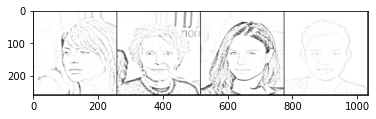

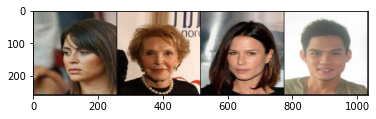

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


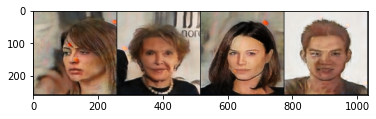

Epoch 28: Step 14400: Generator (U-Net) loss: 17.003179883956903, Discriminator loss: 0.1564840391278267


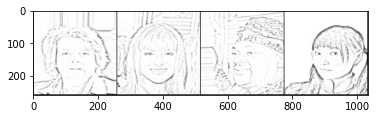

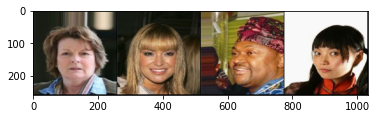

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


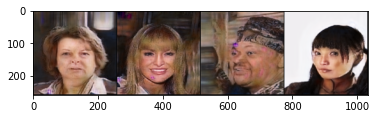

Epoch 29: Step 14600: Generator (U-Net) loss: 16.872307004928587, Discriminator loss: 0.15632513513788585


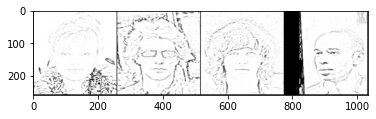

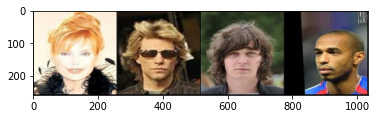

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


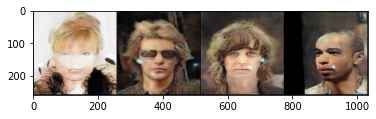

Epoch 29: Step 14800: Generator (U-Net) loss: 16.777698383331284, Discriminator loss: 0.16387236747890713


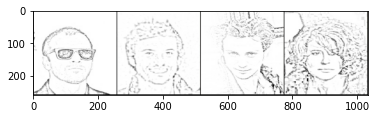

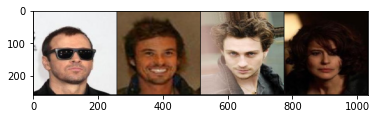

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


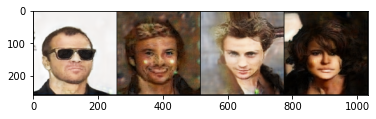

Epoch 30: Step 15000: Generator (U-Net) loss: 16.62092677116395, Discriminator loss: 0.15215533295646305


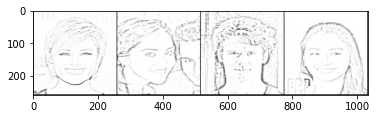

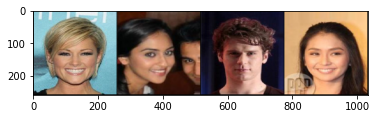

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


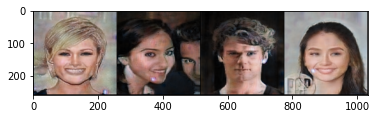

Epoch 30: Step 15200: Generator (U-Net) loss: 16.826079859733582, Discriminator loss: 0.15300738440826545


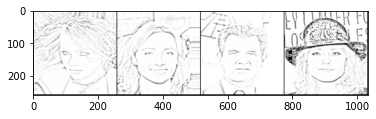

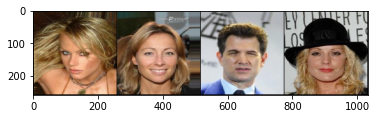

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


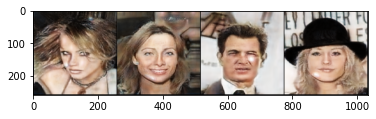

Epoch 30: Step 15400: Generator (U-Net) loss: 16.238426518440257, Discriminator loss: 0.16146041020751006


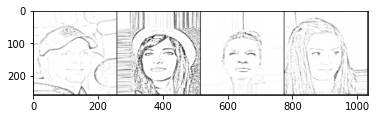

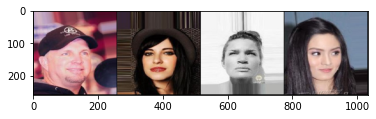

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


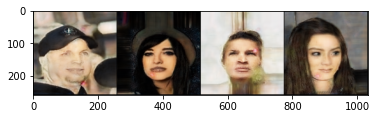

Epoch 31: Step 15600: Generator (U-Net) loss: 16.401690907478333, Discriminator loss: 0.16328096620738505


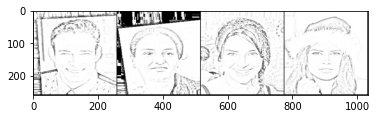

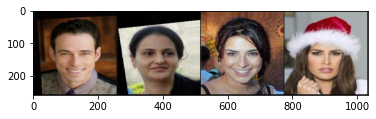

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


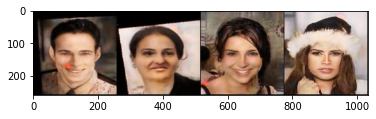

Epoch 31: Step 15800: Generator (U-Net) loss: 16.14084201812744, Discriminator loss: 0.1645129301212728


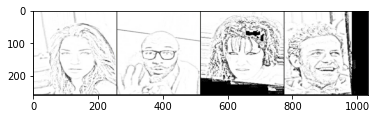

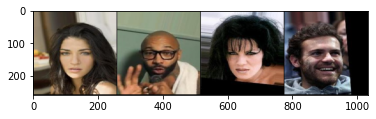

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


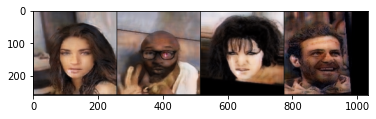

Epoch 32: Step 16000: Generator (U-Net) loss: 16.424022355079643, Discriminator loss: 0.155074676014483


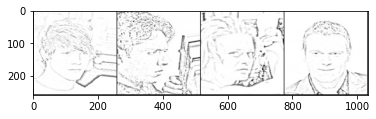

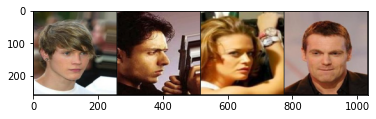

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


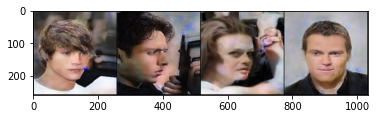

Epoch 32: Step 16200: Generator (U-Net) loss: 15.8765632724762, Discriminator loss: 0.16287541866302493


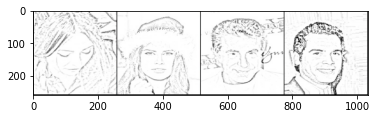

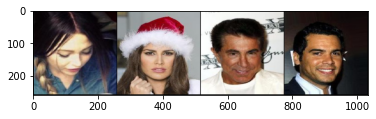

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


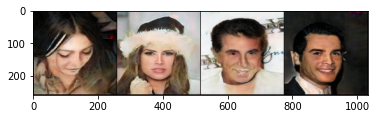

Epoch 32: Step 16400: Generator (U-Net) loss: 16.162509837150576, Discriminator loss: 0.15807126857340334


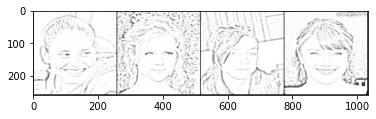

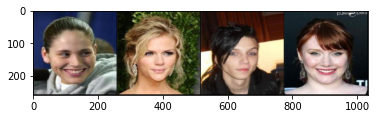

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


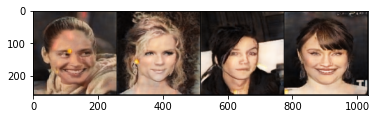

Epoch 33: Step 16600: Generator (U-Net) loss: 16.419538202285764, Discriminator loss: 0.15240549199283127


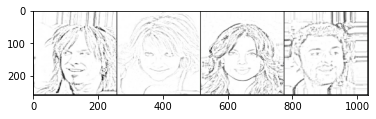

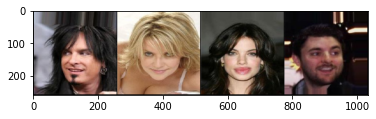

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


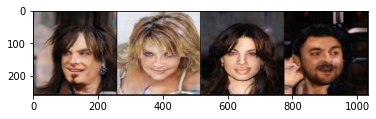

Epoch 33: Step 16800: Generator (U-Net) loss: 15.946904478073119, Discriminator loss: 0.16187078835442661


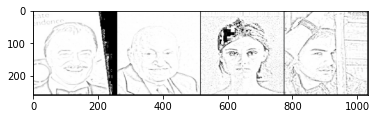

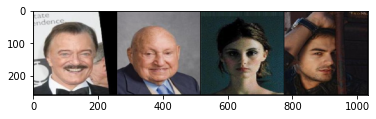

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


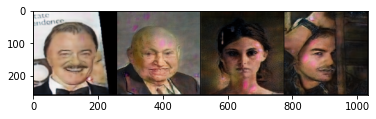

Epoch 34: Step 17000: Generator (U-Net) loss: 16.1993514585495, Discriminator loss: 0.15605362908914677


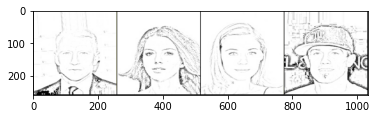

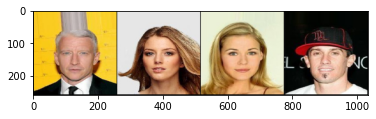

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


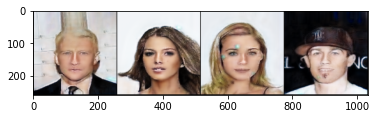

Epoch 34: Step 17200: Generator (U-Net) loss: 15.89313425540924, Discriminator loss: 0.15860659506171945


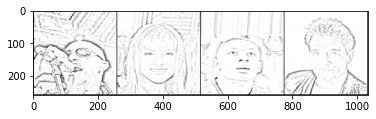

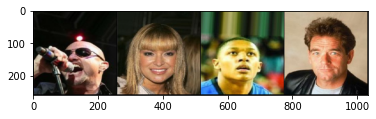

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


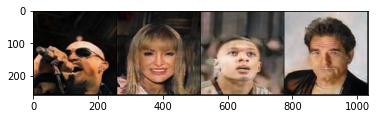

Epoch 34: Step 17400: Generator (U-Net) loss: 15.603334765434271, Discriminator loss: 0.15153203992173067


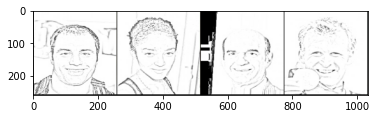

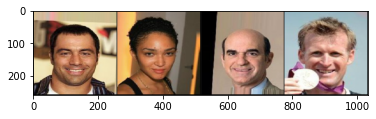

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


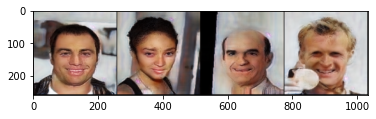

Epoch 35: Step 17600: Generator (U-Net) loss: 15.657575101852428, Discriminator loss: 0.15968069298192855


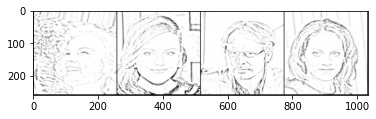

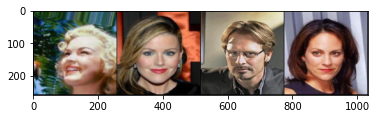

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


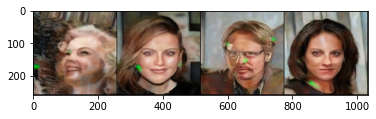

Epoch 35: Step 17800: Generator (U-Net) loss: 15.68518536567688, Discriminator loss: 0.16389716889709247


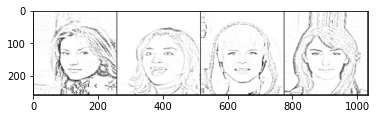

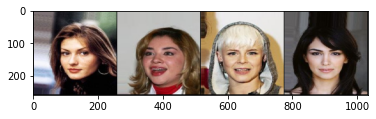

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


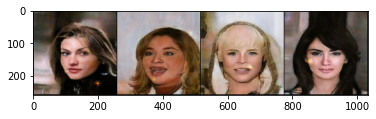

Epoch 36: Step 18000: Generator (U-Net) loss: 16.078217892646798, Discriminator loss: 0.15182785578072078


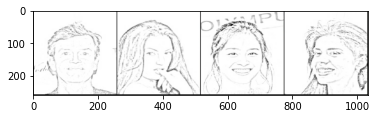

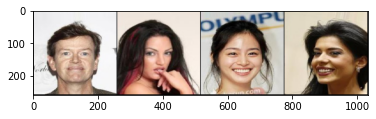

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


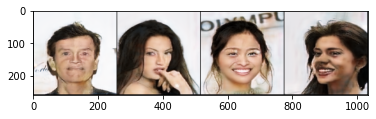

Epoch 36: Step 18200: Generator (U-Net) loss: 15.633555011749268, Discriminator loss: 0.16808437097817644


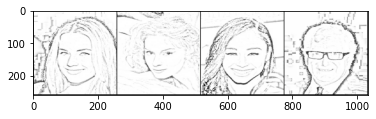

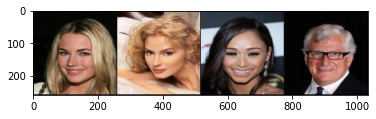

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


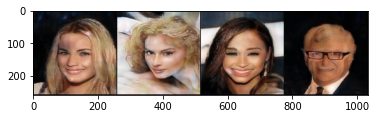

Epoch 36: Step 18400: Generator (U-Net) loss: 15.398036971092226, Discriminator loss: 0.1579556813091039


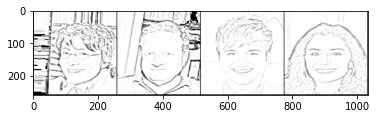

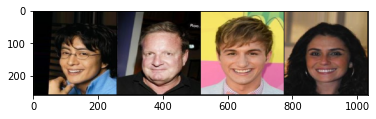

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


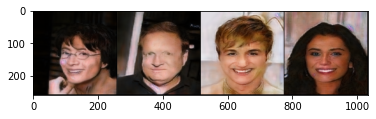

In [ ]:
from skimage import color
import numpy as np

def train(save_model=True):
    mean_generator_loss = 0
    mean_discriminator_loss = 0
#     dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    dataloader = load_data_sets(IMAGE_PATH,batch_size=batch_size)
    cur_step = 0

    for epoch in range(n_epochs):
        # Dataloader returns the batches
        for image, _ in tqdm(dataloader):
            image_width = image.shape[3]
            condition = image[:, :, :, :image_width // 2]
            condition = nn.functional.interpolate(condition, size=target_shape)
            real = image[:, :, :, image_width // 2:]
            real = nn.functional.interpolate(real, size=target_shape)
            cur_batch_size = len(condition)
            condition = condition.to(device)
            real = real.to(device)

            ### Update discriminator ###
            disc_opt.zero_grad() # Zero out the gradient before backpropagation
            with torch.no_grad():
                fake = gen(condition)
            disc_fake_hat = disc(fake.detach(), condition) # Detach generator
            disc_fake_loss = adv_criterion(disc_fake_hat, torch.zeros_like(disc_fake_hat))
            disc_real_hat = disc(real, condition)
            disc_real_loss = adv_criterion(disc_real_hat, torch.ones_like(disc_real_hat))
            disc_loss = (disc_fake_loss + disc_real_loss) / 2
            disc_loss.backward(retain_graph=True) # Update gradients
            disc_opt.step() # Update optimizer

            ### Update generator ###
            gen_opt.zero_grad()
            gen_loss = get_gen_loss(gen, disc, real, condition, adv_criterion, recon_criterion, recon_criterion, lambda_recon)
            gen_loss.backward() # Update gradients
            gen_opt.step() # Update optimizer

            # Keep track of the average discriminator loss
            mean_discriminator_loss += disc_loss.item() / display_step
            # Keep track of the average generator loss
            mean_generator_loss += gen_loss.item() / display_step

            ### Visualization code ###
            if cur_step % display_step == 0:
                if cur_step > 0:
                    print(f"Epoch {epoch}: Step {cur_step}: Generator (U-Net) loss: {mean_generator_loss}, Discriminator loss: {mean_discriminator_loss}")
                else:
                    print("Pretrained initial state")
                #if(epoch % 5 == 0):
                show_tensor_images(condition, size=(input_dim, target_shape, target_shape))
                show_tensor_images(real, size=(real_dim, target_shape, target_shape))
                show_tensor_images(fake, size=(real_dim, target_shape, target_shape))
                losses_g.append(mean_generator_loss)
                losses_d.append(mean_discriminator_loss)
                mean_generator_loss = 0
                mean_discriminator_loss = 0
                # You can change save_model to True if you'd like to save the model
                if save_model and cur_step > 44000:
                    model_save_name = f'finalGAN_{cur_step}.pth'
                    path = F"/content/gdrive/My Drive/PIX2PIX DATA/{model_save_name}" 
                    torch.save({'gen': gen.state_dict(),
                        'gen_opt': gen_opt.state_dict(),
                        'disc': disc.state_dict(),
                        'disc_opt': disc_opt.state_dict()
                    }, path)
            cur_step += 1
            
train()

In [ ]:
# plot and save the generator and discriminator loss
matplotlib.style.use('ggplot')
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
images_dir = '/content/gdrive/My Drive/PIX2PIX DATA'
plt.savefig(f"{images_dir}/final_loss_plot.png")